# Cell type labeling, plotting, and differential gene expression analysis

# Notebook setup

In [61]:
from itertools import chain
from itertools import product
import numpy as np
import anndata as ad
import pandas as pd

import scanpy as sc
import scanpy.external as sce

# import scvelo as scv
# import cellrank as cr
import seaborn as sns
from scipy import io
from scipy import sparse

import gc
gc.enable()

In [4]:
import os
os.chdir('/local/workdir/dwm269/scCardiacOrganoid/')

In [43]:
from scripts.py.scantils import *
# from scripts.py.scanplots import *

In [5]:
# Load metadata
meta = pd.read_csv("resources/metadata.csv")
meta = meta.loc[meta["source"]=="Hoang et al",]
meta = meta.loc[meta["include"],]
meta.index = list(range(0, len(meta)))
meta

,sample,include,data.dir,pattern,pattern_int,timepoint,time_int,cell_line,source,soupx,soupx_rho_GeneFull
0,D0_600um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,600um,600.0,D0,0,GCaMP6f hiPSCs,Hoang et al,False,NaN
1,D1_600um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,600um,600.0,D1,1,GCaMP6f hiPSCs,Hoang et al,False,NaN
2,D4_200um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,200um,200.0,D4,4,GCaMP6f hiPSCs,Hoang et al,True,0.076
3,D4_600um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,600um,600.0,D4,4,GCaMP6f hiPSCs,Hoang et al,True,0.070
4,D4_1000um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,1000um,1000.0,D4,4,GCaMP6f hiPSCs,Hoang et al,True,0.140
5,D6_600um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,600um,600.0,D6,6,GCaMP6f hiPSCs,Hoang et al,True,0.029
6,D8_600um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,600um,600.0,D8,8,GCaMP6f hiPSCs,Hoang et al,True,0.015
7,D12_600um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,600um,600.0,D12,12,GCaMP6f hiPSCs,Hoang et al,True,0.017
8,D21_200um_B,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,200um,200.0,D21,21,GCaMP6f hiPSCs,Hoang et al,True,0.011
9,D21_600um,True,/workdir/dwm269/scCardiacOrganoid/data/STARsol...,600um,600.0,D21,21,GCaMP6f hiPSCs,Hoang et al,True,0.039


## Load in preprocessed data

In [120]:
adata = sc.read_h5ad(
    filename="data/pyobjs/scCO_v7.h5ad" 
)

# https://github.com/scverse/scanpy/issues/2239
adata.uns['log1p']["base"] = None 

### Clustering summary plots

/home/dwm269/miniconda3/envs/pyRNA6/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/dwm269/miniconda3/envs/pyRNA6/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/dwm269/miniconda3/envs/pyRNA6/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/dwm269/miniconda3/envs/pyRNA6/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


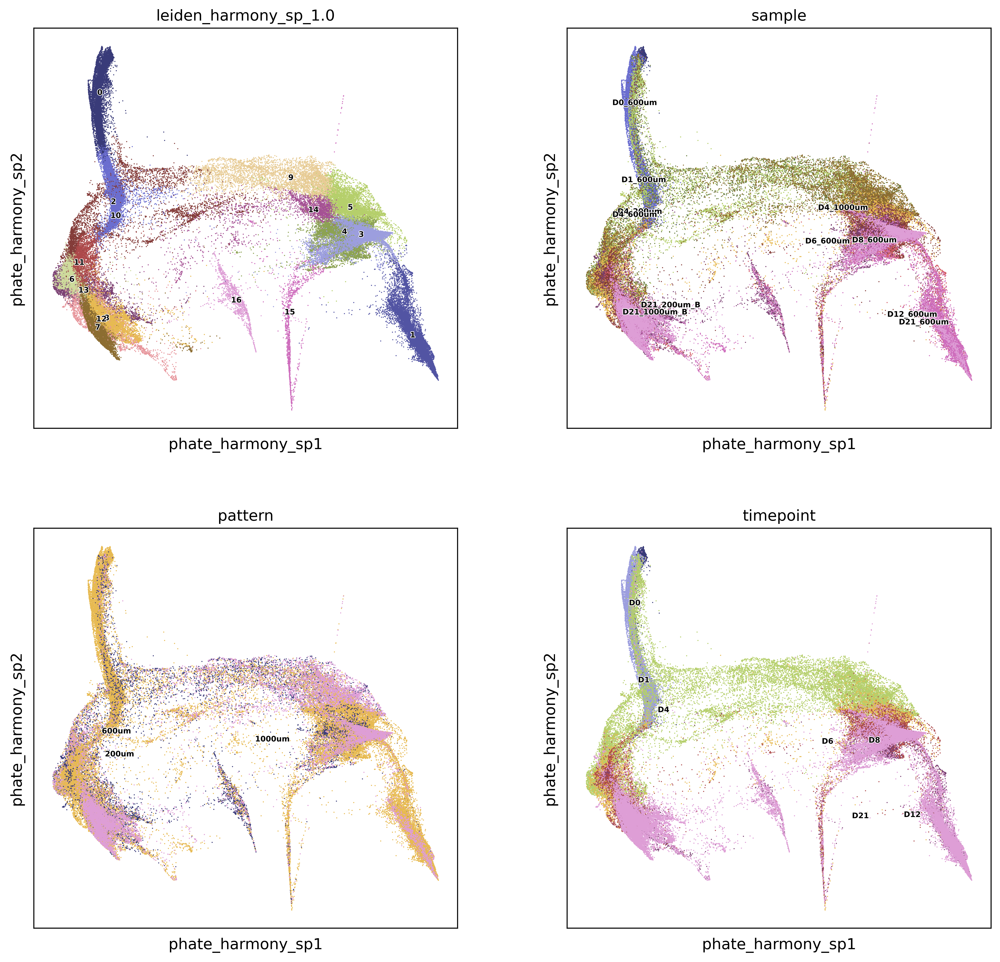

In [93]:
sc.set_figure_params(
    figsize=(6,6),
    fontsize=12,
    transparent=False,
    dpi=200
)
sc.pl.embedding(
    adata,
    basis='phate_harmony_sp',
    # color=['leiden_harmony_sp_1.0'],  #'leiden_harmony', , 'leiden_harmony_s_1.0'
#     color = ['APOA1','KDR', 'FAM184A','CDH2'],
#     color = ['GATA2','GATA3', 'GATA4','GATA6'],
    color=['leiden_harmony_sp_1.0','sample','pattern','timepoint'],
#     edges=True, edges_width=0.01, 
    edges=False, legend_loc='on data', legend_fontsize=6,legend_fontoutline=1, #labels on plot
    palette='tab20b',
    color_map='viridis',
    size=3,
    sort_order=True,
#     return_fig=True,
    ncols=2
)

# Annotate cell types

In [10]:
# import csv
# reader = csv.DictReader(open('/workdir/dwm269/ma_ipsc/resources/ma_ipsc_gene_markers.csv'))
# marker_genes_dict = next(reader) 
# print(marker_genes_dict)

Canonical genes list, `genes_dict`:

In [99]:
genes_dict = {
    'iPSC':['POUSR1','POU5F1','SOX2','NANOG','ST3GAL2','CDH1','SSEA4'], #EPCAM
    'Gastr_Cells_Prim_Streak': ['MIXL1','CER1','EOMES','SOX17','NODAL','APLNR','TBX6','HES7','TBXT'],
    'Posterior_PS':['ETV2','EVX1','ENG','TGFBR1'],
    'Mesendoderm_Prim_Endoderm':['SOX17','GATA4','GATA6','SOX7','FOXA2'],
    'Distal_Foregut_Pancreas':['PDX1','HHEX','MNX1','SOX9'],#'HNF6',
    'Posterior_Foregut_Liver':['ALB','CDH6','AFP','ONECUT2','HNF4A','FOXA1','FOXA2'],
    'Gut_Mesenchyme':['ALCAM','CDH1','CXCL12','PITX2','LHX2','MEX2','DES'], #'NCAM1','PBX1'
    'Endoderm_Gut_Cells':['ALB','CDH6','AFP','ONECUT2','HNF4A'],
    'Gut_Silva':['LGALS4','TSPAN8','MT1M'],
    'Stromal_Fibroblasts':['VIM','TAGLN2','COL1A1','COL3A1','TWIST1','PRRX1','THY1','POSTN','DCN','SPARC','HAND1'],
    'Mural_Cell':['RGS5','TAGLN','ANKRD1'],
    'Smooth_Muscle':['ACTA2','ACTG2','MYL9','MYH11','TPM2','TAGLN2','CNN1','SMTN','CALD1','NPPB'],#'SM22',
    'Cardiac_Mesoderm':['EOMES','ISL1','MESP1','MESP2'],#,'LHX1'
    'Endocardial':['TEK','NPC2','NPR3','NFATC1','PECAM1','CDH5','CD34','KDR','GATA5','TBX3'],#'TM4SF1',
    'Epicardial':['WT1','TBX18','TCF21','NR2F2'],
    'Cardiomyocytes':['ACTN2','MYH6','MYH7','MYL4','MYL7','TTN','NCAM1','PBX1'],#'TNNT2',
    'First_Heart_Field':['TBX5','HCN4','HAND1'],
    'Second_Heart_Field':['HAND2','TBX1','CXCR4','TBX20'],
    'Melanocyte':['MLANA','DCT','TFAP2A'],
    'Neural': ['ALDH1A1','ISL1','STMN2', 'TH', 'SLC18A3']
#     'DEGs_old':['TGFBI','ANXA1','FBLN1','FOS','WNT6','GATA3','IGFBP7','CNTNAP2','GAL'], #'IGFB',
#     'DEGs_new':[
#         'CDH11','TMEM88','PCDH11X','LINC00698','CD9','TMSB4X','CDH2','DKK1','CPED1','CXCL14',
#                 'TECRL','NRXN3','APOA1','GNG11','GABRP','ARHGAP29','KCNMA1','PTN','TMTC2','TIMP1','KCNQ5'
#     ]
}

# Filter out genes that were not detected
for CT in genes_dict.keys():
    genes_dict[CT] = [k for k in genes_dict[CT] if k in adata.var_names]

# print(list(genes_dict.keys()))
print(genes_dict)

{'iPSC': ['POU5F1', 'NANOG', 'ST3GAL2', 'CDH1'], 'Gastr_Cells_Prim_Streak': ['MIXL1', 'EOMES', 'NODAL', 'APLNR', 'TBX6', 'HES7'], 'Posterior_PS': ['ETV2', 'ENG', 'TGFBR1'], 'Mesendoderm_Prim_Endoderm': ['GATA4', 'GATA6', 'FOXA2'], 'Distal_Foregut_Pancreas': ['PDX1', 'HHEX', 'MNX1', 'SOX9'], 'Posterior_Foregut_Liver': ['ALB', 'CDH6', 'AFP', 'ONECUT2', 'HNF4A', 'FOXA1', 'FOXA2'], 'Gut_Mesenchyme': ['ALCAM', 'CDH1', 'CXCL12', 'PITX2', 'LHX2', 'DES'], 'Endoderm_Gut_Cells': ['ALB', 'CDH6', 'AFP', 'ONECUT2', 'HNF4A'], 'Gut_Silva': ['TSPAN8'], 'Stromal_Fibroblasts': ['VIM', 'TAGLN2', 'COL1A1', 'COL3A1', 'TWIST1', 'PRRX1', 'THY1', 'POSTN', 'DCN', 'SPARC'], 'Mural_Cell': ['RGS5', 'TAGLN', 'ANKRD1'], 'Smooth_Muscle': ['ACTA2', 'ACTG2', 'MYL9', 'TPM2', 'TAGLN2', 'CNN1', 'SMTN', 'CALD1', 'NPPB'], 'Cardiac_Mesoderm': ['EOMES', 'ISL1', 'MESP1', 'MESP2'], 'Endocardial': ['TEK', 'NPC2', 'NPR3', 'NFATC1', 'PECAM1', 'CDH5', 'CD34', 'KDR', 'GATA5', 'TBX3'], 'Epicardial': ['WT1', 'TBX18', 'NR2F2'], 'Cardi

In [139]:
genes_slim = {
    'iPSC':['POU5F1','SOX2','NANOG','ST3GAL2','CDH1'], 
    'Prim_Streak': ['MIXL1','TBXT','EOMES','EVX1','NODAL'],
    'Cardiac_Mesoderm':['MESP1','ISL1','APLNR','LHX1'],
    'Definitive_Endoderm':['SOX17','EPCAM','GATA6','FOXA2'],
    'Smooth_Muscle':['ACTA2','TAGLN','SMTN','CNN1'],
    'Stromal_Fibroblasts':['VIM','TCF21','TBX6','NPC2','COL1A1'],
    'Epicardial':['LHX2','WT1','TBX18'],
    'Endocardial':['ENG','KDR','CDH5','PECAM1','CD34'],
    'Cardiomyocytes':['MYH6','MYH7','MYL2','MYL4','TBX5','NKX2-5','HAND1','HAND2'],
    'Foregut_Epithelium':['HHEX','SOX9','CDH6','ONECUT2','FOXA1'],
    'Gut_Mesenchyme':['NPPB','ALCAM','PITX2','PBX1','APOA2'],
    'Liver_Progenitor':['ALB','AFP','HNF4A','ICAM1','NCAM1']    
}

# Filter out genes that were not detected
for CT in genes_slim.keys():
    genes_slim[CT] = [k for k in genes_slim[CT] if k in adata.var_names]

print(genes_slim)

{'iPSC': ['POU5F1', 'NANOG', 'ST3GAL2', 'CDH1'], 'Prim_Streak': ['MIXL1', 'EOMES', 'NODAL'], 'Cardiac_Mesoderm': ['MESP1', 'ISL1', 'APLNR'], 'Definitive_Endoderm': ['EPCAM', 'GATA6', 'FOXA2'], 'Smooth_Muscle': ['ACTA2', 'TAGLN', 'SMTN', 'CNN1'], 'Stromal_Fibroblasts': ['VIM', 'TBX6', 'NPC2', 'COL1A1'], 'Epicardial': ['LHX2', 'WT1', 'TBX18'], 'Endocardial': ['ENG', 'KDR', 'CDH5', 'PECAM1', 'CD34'], 'Cardiomyocytes': ['MYH6', 'MYL4', 'TBX5', 'NKX2-5', 'HAND2'], 'Foregut_Epithelium': ['HHEX', 'SOX9', 'CDH6', 'ONECUT2', 'FOXA1'], 'Gut_Mesenchyme': ['NPPB', 'ALCAM', 'PITX2', 'PBX1', 'APOA2'], 'Liver_Progenitor': ['ALB', 'AFP', 'HNF4A', 'ICAM1', 'NCAM1']}


## `harmony_sp` embedding 

### Top genes by cluster

In [85]:
sc.tl.rank_genes_groups(
    adata, 
    groupby='leiden_harmony_sp_1.0', 
    method='wilcoxon',
    layer='data',
    pts=True
)

In [86]:
tmp = pd.DataFrame(adata.uns['rank_genes_groups']['names'])
print(tmp.iloc()[1:20,:])

                0       1         2        3         4          5  \
1           SFRP2  SLC8A1     SFRP2   COL1A1    COL3A1     HAPLN1   
2    CTD-2306M5.1  PDLIM5    MT-ND4   COL6A2   ZNRF2P2       HAS2   
3    RP11-415G4.1    RYR2    MT-CO2   COL1A2    COL1A1      CGNL1   
4   RP11-436D23.1    MYL4       RAN      VIM    COBLL1      BMPER   
5             CD9  CTNNA3   MT-ATP6    ZFPM2      SOX6      TENM4   
6            XACT    MYL7       CD9     ZEB2    AKAP12        VIM   
7         GALNT17   TNNI1      CYCS   COL5A2      BNC2    DYNC1I1   
8           DPPA4     PLN  HSP90AA1   PDZRN4    TMEM98    RHOBTB3   
9          SEMA6A   ACTC1     HMGA1    IL6ST   SEPTIN7     TMEM88   
10          ADCY2   CHRM2     C1QBP    FREM1  SLC9A3R1      MEIS1   
11         PTPRZ1    TPM1    MT-CO3   IGFBP7   ARHGAP6      CDK14   
12          L1TD1   MYOM1     HSPD1   COL6A3    CCDC80     PTPN13   
13           SYT1  FILIP1     GAPDH    CDH11       EZR       CDK6   
14            TKT   PALLD     PRDX

### PHATE plots

/home/dwm269/miniconda3/envs/pyRNA6/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


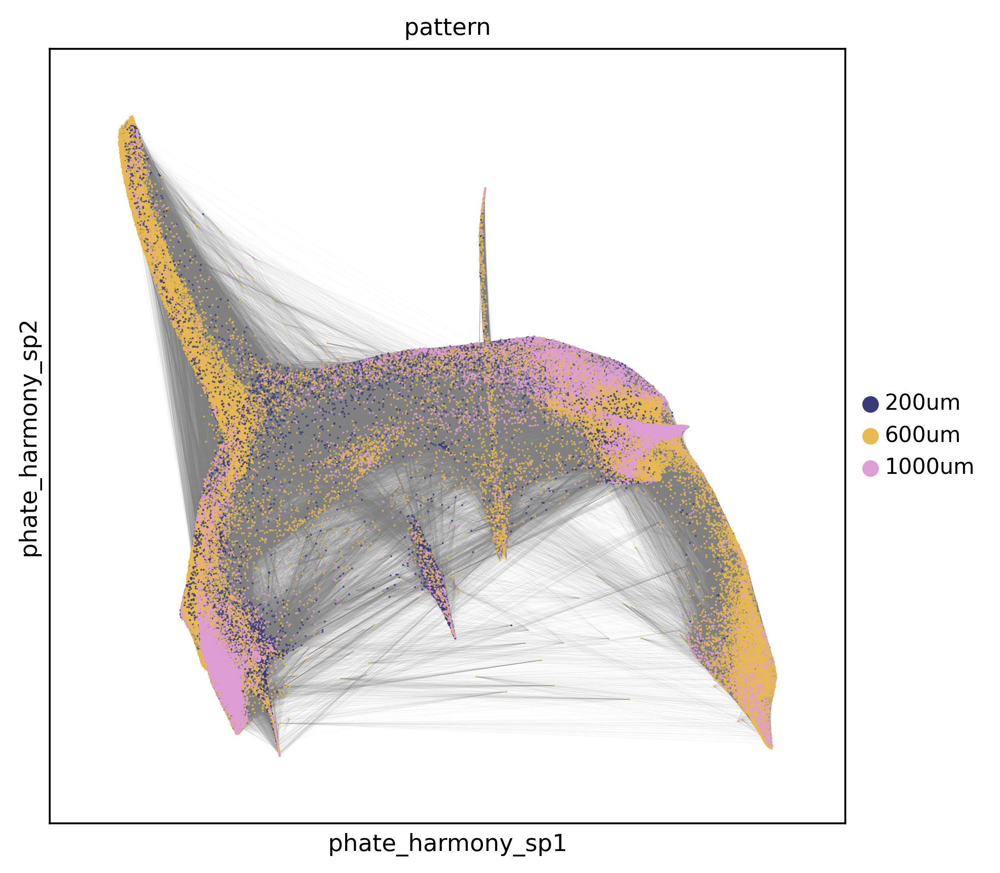

In [15]:
sc.set_figure_params(
    figsize=(6,6),
    fontsize=10,
    transparent=False,
    dpi=200
)
sc.pl.embedding(
    adata,
    basis='phate_harmony_sp',
    # color=['leiden_harmony_sp_10_types','pattern'], 
    color=['pattern'],
    edges=True, edges_width=0.01, 
    # legend_loc='on data', legend_fontsize=6,legend_fontoutline=1, #labels on plot
    palette='tab20b',
    color_map='cividis',
    size=3, alpha=0.8,
    sort_order=True,
#     return_fig=True,
    ncols=3
)

### DotPlot(s)

categories: iPSCs_0, Cardiomyocytes_1, Primitive_Streak_2, etc.
var_group_labels: Cardiomyocytes, First_Heart_Field, Second_Heart_Field


/home/dwm269/miniconda3/envs/pyRNA6/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


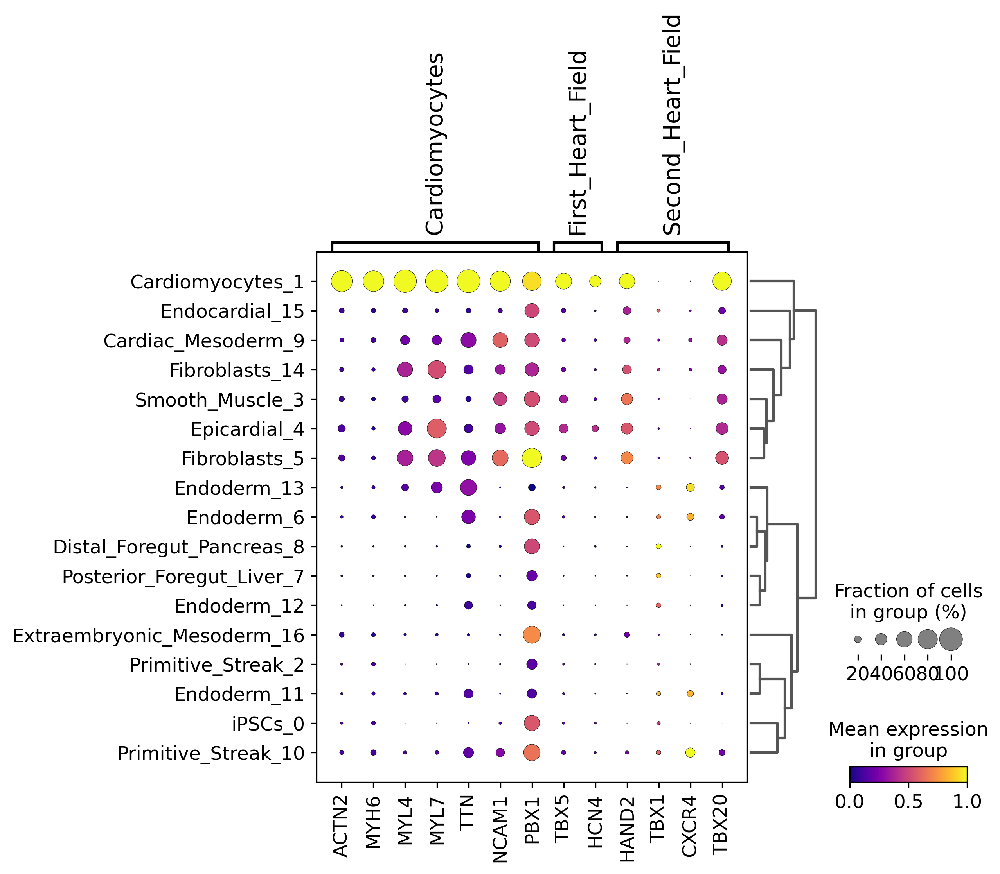

In [118]:
sc.set_figure_params(
    figsize=(3,3),
    dpi=150,
    transparent=True
)

#'iPSC', 'Gastr_Cells_Prim_Streak', 'Posterior_PS', 'Mesendoderm_Prim_Endoderm', 
# 'Distal_Foregut_Pancreas', 'Posterior_Foregut_Liver','Gut_Mesenchyme', 'Endoderm_Gut_Cells'
#'Stromal_Fibroblasts', 'Mural_Cell', 'Smooth_Muscle', 'Cardiac_Mesoderm', 
# 'Endocardial', 'Epicardial', 
# 'Cardiomyocytes', 'First_Heart_Field', 'Second_Heart_Field'

tmp_cell_type=[
    # 'iPSC', 'Gastr_Cells_Prim_Streak', 'Posterior_PS',# 'Mesendoderm_Prim_Endoderm'
    # 'Gut_Mesenchyme', 'Endoderm_Gut_Cells',#'Gut_Silva'    
    # 'Distal_Foregut_Pancreas', 'Posterior_Foregut_Liver'
    # 'Cardiac_Mesoderm','Stromal_Fibroblasts', 'Mural_Cell', 'Smooth_Muscle',
    # 'Endocardial', 'Epicardial',
    'Cardiomyocytes', 'First_Heart_Field', 'Second_Heart_Field'
]

if False: #switch for whether or not to recompute dendrogram...
    sc.tl.dendrogram(
        adata,
        # groupby="leiden_harmony_sp_1.0",
        groupby="leiden_harmony_sp_anno",
        n_pcs = npcs(adata,reduction="harmony_sp"),
        use_rep="harmony_sp"
        # var_names=""
    )

sc.pl.dotplot(
    adata,
    var_names={key:genes_dict[key] for key in tmp_cell_type},# title=tmp_cell_type,
    # var_names=genes_dict,
    # groupby="leiden_harmony_sp_1.0",
    groupby="leiden_harmony_sp_anno",
    color_map="plasma",
    swap_axes=False,
#     color_map='Greys',
#     use_raw=False,
    standard_scale ='var',
    dendrogram=True
)

categories: iPSCs_0, Cardiomyocytes_1, Primitive_Streak_2, etc.
var_group_labels: iPSC, Prim_Streak, Cardiac_Mesoderm, etc.


/home/dwm269/miniconda3/envs/pyRNA6/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


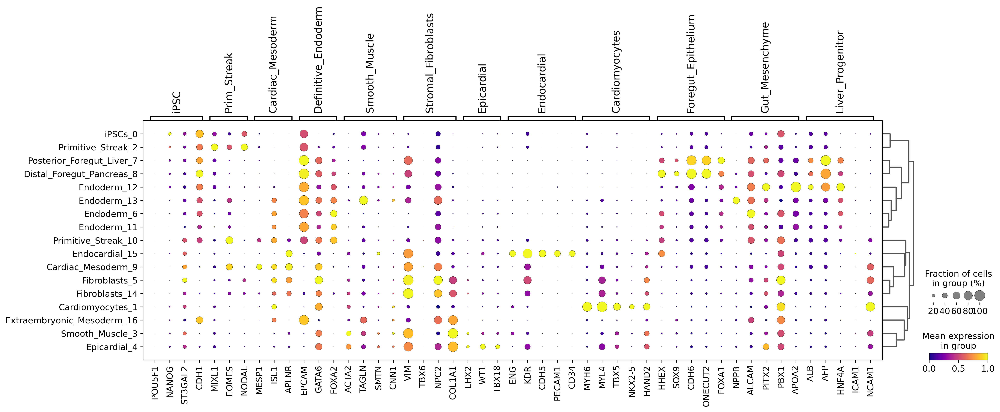

In [138]:
sc.set_figure_params(
    figsize=(3,3),
    dpi=150,
    transparent=True
)

tmp_cell_type=[
    'iPSC', 'Prim_Streak', 'Cardiac_Mesoderm', 'Definitive_Endoderm', 
    'Smooth_Muscle', 'Stromal_Fibroblasts', 'Epicardial', 'Endocardial', 'Cardiomyocytes', 
    'Foregut_Epithelium', 'Gut_Mesenchyme', 'Liver_Progenitor'
]

if True: #switch for whether or not to recompute dendrogram...
    sc.tl.dendrogram(
        adata,
        # groupby="leiden_harmony_sp_1.0",
        groupby="cell_types",
        n_pcs = npcs(adata,reduction="harmony_sp"),
        use_rep="harmony_sp"
        # var_names=""
    )

sc.pl.dotplot(
    adata,
    var_names={key:genes_slim[key] for key in tmp_cell_type},# title=tmp_cell_type,
    # var_names=genes_dict,
    # groupby="leiden_harmony_sp_1.0",
    groupby="leiden_harmony_sp_anno",
    # groupby="cell_types",
    color_map="plasma",
    swap_axes=False,
#     color_map='Greys',
#     use_raw=False,
    standard_scale ='var',
    dendrogram=True
)

In [127]:
genes_slim.keys()

dict_keys(['iPSC', 'Prim_Streak', 'Cardiac_Mesoderm', 'Definitive_Endoderm', 'Smooth_Muscle', 'Stromal_Fibroblasts', 'Epicardial', 'Endocardial', 'Cardiomyocytes', 'Foregut_Epithelium', 'Gut_Mesenchyme', 'Posterior_Foregut_Liver'])

Label clusters using resolution value of 1.0

In [129]:
# res = 1.0
old_to_new = {
    '0':'iPSCs_0',
    '1':'Cardiomyocytes_1', 
    '2':'Primitive_Streak_2', 
    '3':'Smooth_Muscle_3', 
    '4':'Epicardial_4',
    '5':'Fibroblasts_5', 
    '6':'Endoderm_6', 
    '7':'Posterior_Foregut_Liver_7',
    '8':'Distal_Foregut_Pancreas_8', 
    '9':'Cardiac_Mesoderm_9', 
    '10':'Primitive_Streak_10',
    '11':'Endoderm_11', 
    '12':'Endoderm_12', 
    '13':'Endoderm_13', 
    '14':'Fibroblasts_14',
    '15':'Endocardial_15',
    '16':'Extraembryonic_Mesoderm_16'
}
old_to_new = {
    '0':'iPSCs',
    '1':'Cardiomyocytes', 
    '2':'Primitive_Streak', 
    '3':'Smooth_Muscle', 
    '4':'Epicardial',
    '5':'Fibroblasts', 
    '6':'Definitive_Endoderm', 
    '7':'Foregut_Epithelium',
    '8':'Foregut_Epithelium', 
    '9':'Cardiac_Mesoderm', 
    '10':'Primitive_Streak',
    '11':'Definitive_Endoderm', 
    '12':'Definitive_Endoderm', 
    '13':'Definitive_Endoderm', 
    '14':'Fibroblasts',
    '15':'Endocardial',
    '16':'Extraembryonic_Mesoderm'
}
adata.obs['cell_types'] = (
    adata.obs['leiden_harmony_sp_1.0'].map(old_to_new).astype('category')
)
adata.obs['cell_types'].value_counts()

Definitive_Endoderm        15825
Primitive_Streak           14323
iPSCs                      12932
Cardiomyocytes             10882
Foregut_Epithelium         10228
Fibroblasts                 9317
Smooth_Muscle               8808
Epicardial                  7199
Cardiac_Mesoderm            4498
Endocardial                 1235
Extraembryonic_Mesoderm     1154
Name: cell_types, dtype: int64

In [119]:
adata.layers

Layers with keys: counts, data

In [ ]:
# old_cluster_names = [
#     'Stromal (HAND1+)', # 0
#     'iPSCs_1', #1
#     'Mesendoderm_2', #2
#     'Posterior_Foregut_Liver_3', #3
#     'Gastr_Cells_Prim_Streak', #4
#     'Cardiomyocytes_5', #5
#     'Stromal_Smooth_Muscle_6', #6
#     'Cardiomyocytes_7', #7
#     'Cardiac_Mesoderm_8', #8
#     'Epicardial (SPARC+)', #9
#     'Stromal (ANKRD1+)', #10
#     'Posterior_Foregut_Liver_11', #11
#     'Endocardial_12', #12
#     'Posterior_Foregut_Liver_13', #13
#     'Unknown_14' #14
# ]

# old_to_new = {
#     '0':'Fibroblasts', # 0
#     '1':'iPSCs', #1
#     '2':'Definitive Endoderm', #2
#     '3':'Foregut Epithelium', #3
#     '4':'Primitive Streak', #4
#     '5':'Cardiomyocytes (late)', #5
#     '6':'Smooth Muscle', #6
#     '7':'Cardiomyocytes (early)', #7
#     '8':'Cardiac Mesoderm', #8
#     '9':'Epicardial', #9
#     '10':'Gut Mesenchyme', #10
#     '11':'Gut Mesenchyme', #11
#     '12':'Endocardial', #12
#     '13':'Liver Progenitors', #13
#     '14':'Extraembryonic Mesoderm' #14
# }

In [20]:
gc.collect()

3745976

In [113]:
adata.shape

(96401, 24072)

/home/dwm269/miniconda3/envs/pyRNA6/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


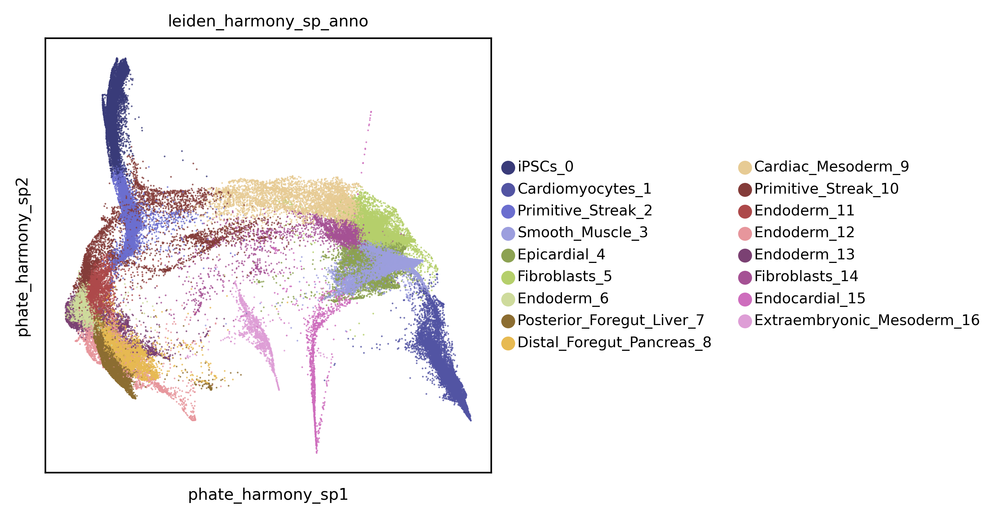

In [114]:
sc.set_figure_params(
    figsize=(4,4),
    fontsize=8,
    transparent=False,
    dpi=200
)
sc.pl.embedding(
    adata,
    basis='phate_harmony_sp',
    color=['leiden_harmony_sp_anno'], #,'pattern'
#     color=['leiden_harmony_types'],
    # edges=True, edges_width=0.01,
    # legend_loc='on data', legend_fontsize=6, legend_fontoutline=0.75, #labels on plot
    palette='tab20b',
    color_map='cividis',
    size=3, alpha=0.8,
    sort_order=True,
#     return_fig=True,
    ncols=3
)

## `harmony_s` embedding

/home/dwm269/miniconda3/envs/pyRNA6/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


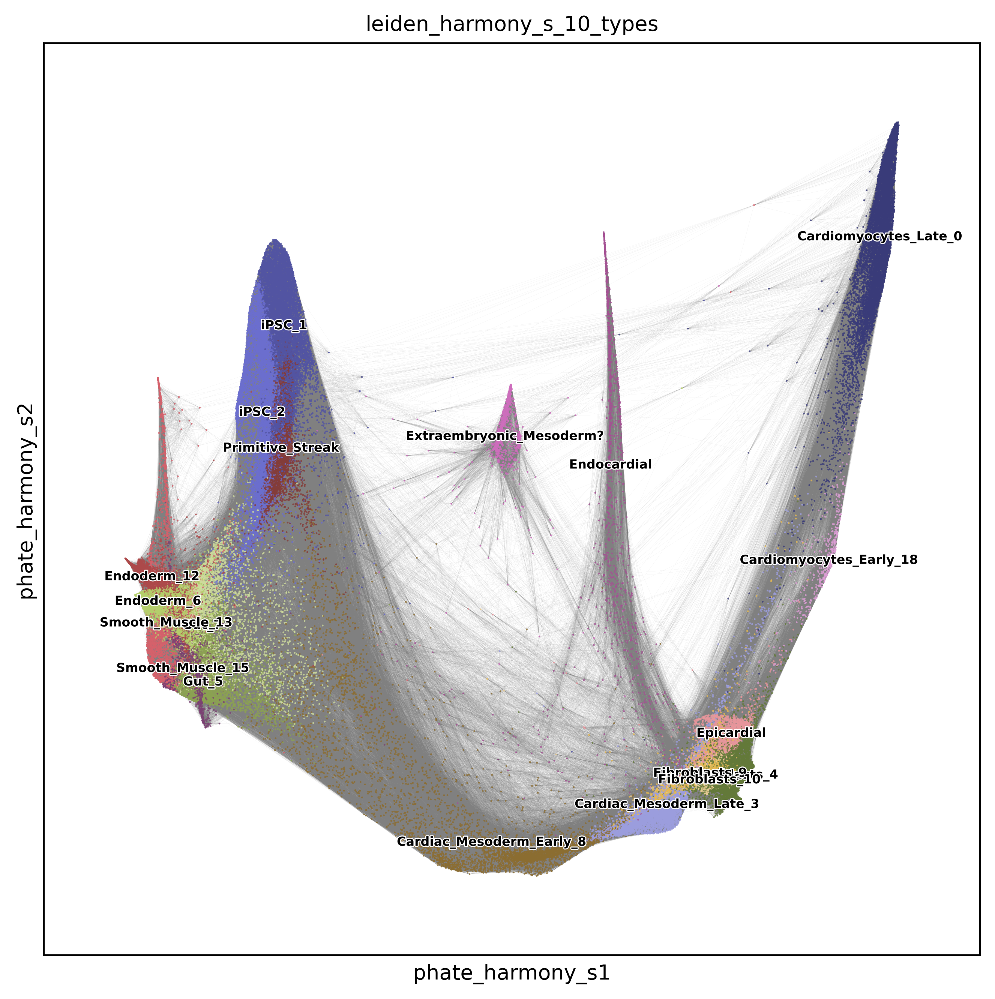

In [22]:
sc.set_figure_params(
    figsize=(8,8),
    fontsize=10,
    transparent=False,
    dpi=200
)
sc.pl.embedding(
    adata,
    basis='phate_harmony_s',
    color=['leiden_harmony_s_1.0'], #,'pattern'
#     color=['leiden_harmony_s_anno'],
    edges=True, edges_width=0.01,
    legend_loc='on data', legend_fontsize=6,legend_fontoutline=1, #labels on plot
    palette='tab20b',
    color_map='cividis',
    size=3, alpha=0.8,
    sort_order=True,
#     return_fig=True,
    ncols=3
)

#### DotPlot(s)

categories: Cardiomyocytes_Late_0, iPSC_1, iPSC_2, etc.
var_group_labels: Endocardial, Epicardial


/home/dwm269/miniconda3/envs/pyRNA6/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


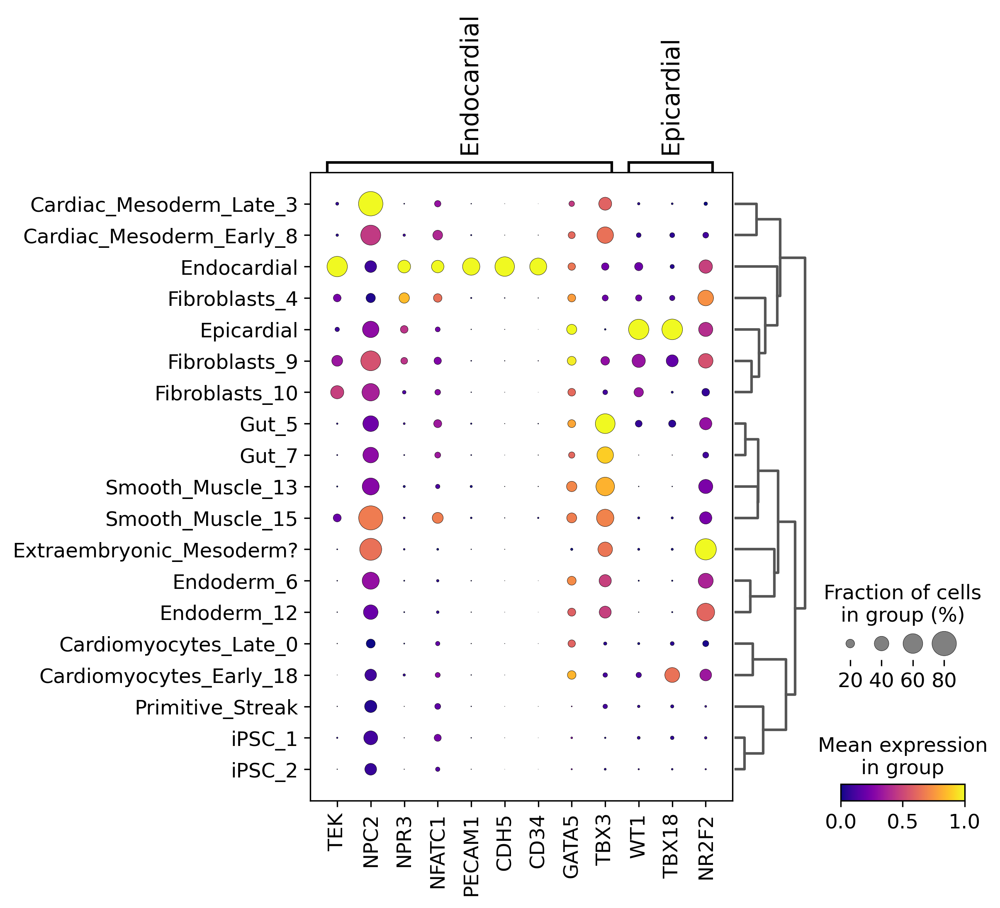

In [23]:
sc.set_figure_params(
#     figsize=(6,6),
    dpi=150,
    transparent=True
)

#'iPSC', 'Gastr_Cells_Prim_Streak', 'Posterior_PS', 'Mesendoderm_Prim_Endoderm', 
# 'Distal_Foregut_Pancreas', 'Posterior_Foregut_Liver', 'Gut_Mesenchyme', 'Endoderm_Gut_Cells',
#'Stromal_Fibroblasts', 'Mural_Cell', 'Smooth_Muscle', 'Cardiac_Mesoderm', 
#'Endocardial', 'Epicardial', 
# 'Cardiomyocytes', 'First_Heart_Field', 'Second_Heart_Field'

tmp_cell_type=['Endocardial', 'Epicardial']

sc.pl.dotplot(
    adata,
    var_names={key:genes_dict[key] for key in tmp_cell_type},
    # var_names=genes_dict,
#     groupby='leiden_harmony_types', 
    groupby="leiden_harmony_s_10_types",
    color_map="plasma",
    swap_axes=False,
#     color_map='Greys',
#     use_raw=False,
    standard_scale ='var',
    dendrogram=True
)

In [24]:
old_to_new = {
    '0':'Cardiomyocytes_Late_0',
    '1':'iPSC_1', 
    '2':'iPSC_2', 
    '3':'Cardiac_Mesoderm_Late_3', 
    '4':'Fibroblasts_4',
    '5':'Gut_5', 
    '6':'Endoderm_6', 
    '7':'Gut_7',
    '8':'Cardiac_Mesoderm_Early_8', 
    '9':'Fibroblasts_9', 
    '10':'Fibroblasts_10',
    '11':'Primitive_Streak', 
    '12':'Endoderm_12', 
    '13':'Smooth_Muscle_13', 
    '14':'Epicardial',
    '15':'Smooth_Muscle_15',
    '16':'Endocardial',
    '17':'Extraembryonic_Mesoderm?',
    '18':'Cardiomyocytes_Early_18'
}

adata.obs['leiden_harmony_s_10_types'] = (
    adata.obs['leiden_harmony_s_10'].map(old_to_new).astype('category')
)

/home/dwm269/miniconda3/envs/pyRNA6/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


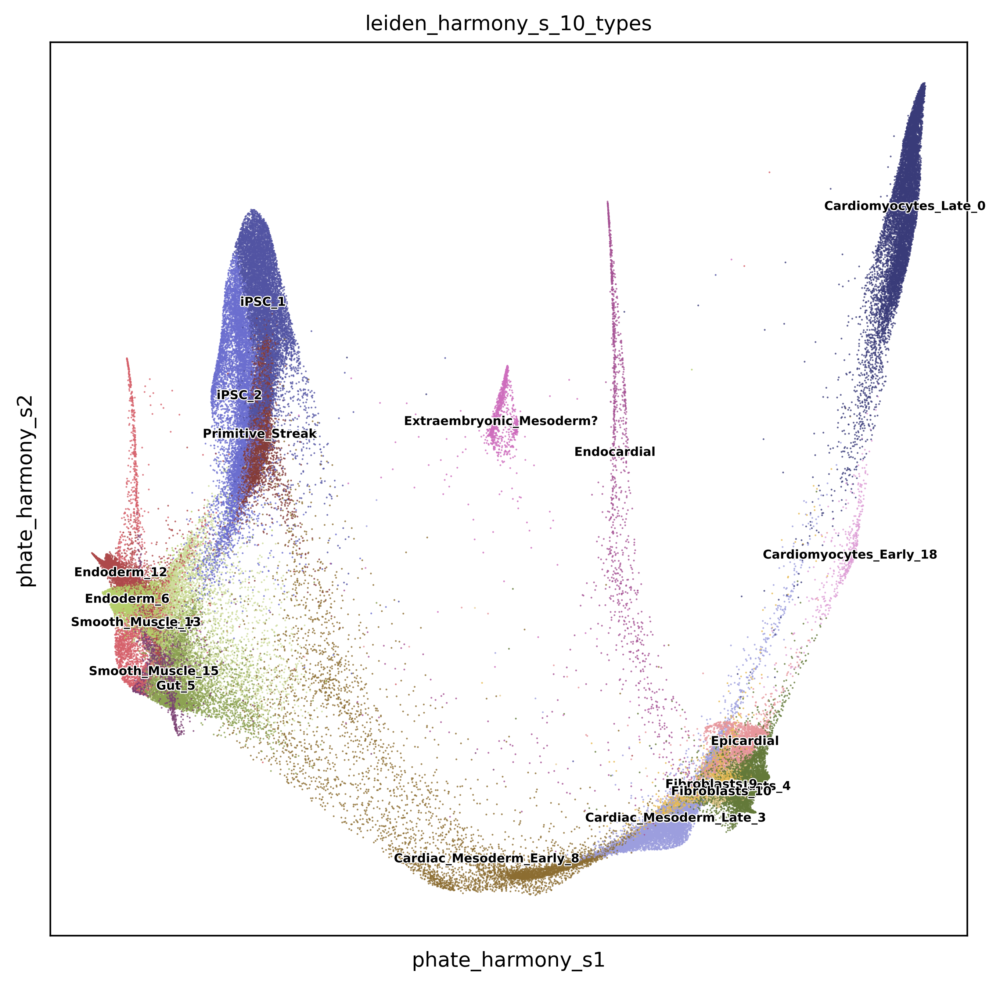

In [25]:
sc.set_figure_params(
    figsize=(8,8),
    fontsize=10,
    transparent=False,
    dpi=200
)
sc.pl.embedding(
    adata,
    basis='phate_harmony_s',
    color=['leiden_harmony_s_10_types'], 
    edges=False,
    edges_width=0.01,
    legend_loc='on data', legend_fontsize=6,legend_fontoutline=1, #labels on plot
    palette='tab20b',
    color_map='cividis',
    size=3, alpha=0.8,
    sort_order=True,
#     return_fig=True,
    ncols=3
)

# Save preprocessed object for future analyses (python & R)

Adjust the metadata column names to enable conversion to `.h5seurat` file
- Borrowed from [erosix](https://github.com/erosix) [here](https://github.com/mojaveazure/seurat-disk/issues/100)

In [107]:
# adata.obs.columns = [sub.replace('(', '') for sub in adata.obs.columns]
# adata.obs.columns = [sub.replace(')', '') for sub in adata.obs.columns]
# adata.obs.columns = [sub.replace('/', '') for sub in adata.obs.columns]
# adata.obs.columns = [sub.replace('=', '.') for sub in adata.obs.columns]
# adata.obs.columns = [sub.replace(' ', '_') for sub in adata.obs.columns]
# adata.obs.columns = [sub.replace('-', '_') for sub in adata.obs.columns]

In [132]:
# Save h5ad object for subsequent python analyses
adata.write("data/pyobjs/scCO_v7-1.h5ad")

# Save Seurat compatible object for subsequent R analyses
#TODO
# https://mojaveazure.github.io/seurat-disk/articles/convert-anndata.html

In [109]:
gc.collect()

29967